# Interpretability Notebook

This notebook will apply the following interpretability methodologies to the various models to get an interpretability profile for the
various ML models. This will then be used to generate various interpretability stastics. 

1. SHAP
2. RuleMatrix
3. LRP
4. LIME

In [1]:
# Imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
tf.compat.v1.disable_v2_behavior()

# Import os path libraries (basic python)
import os
# Math library for some operations (basic python)
import math
# Library for shell utility functions (basic python)
import shutil
# Library for permuting lists (basic python)
import itertools

# Numpy computation libraries
import numpy as np

# pandas library for loading, creating, and manipulating data frames
import pandas as pd

# Scipy library for pre processing and computing funcations
from scipy.ndimage.filters import maximum_filter1d
from sklearn import preprocessing

# Imports from numba for parallel and optimized operations
from numba import prange, njit

# Tensorflow dependent functions and features
from tensorboard.plugins.hparams import api as hp

from lime import lime_tabular

import os

import re

import h5py

# Import math library from scipy
from scipy.stats import entropy


Instructions for updating:
non-resource variables are not supported in the long term


# Loading the dataset
This next section of the notebook will load the dataset and get the section of the dataset we will use to make predictions.


## Setup Data Files

This next section will setup the paths for specific sections of input data and logging for this training process

In [2]:
# Code to load the dataset files
def load_dataset_from_file(file_path, key='delta_1',
                           start = np.datetime64("2017-08-18 17:30:00"),
                           end = np.datetime64("2018-09-05 23:58:00")):
    # Load the data file using pandas and filter between timestamps
    loaded_data = pd.read_hdf(file_path, key)

    # Filter data by timestamps
    timestamps = loaded_data["timestamp"].astype("datetime64").to_numpy()
    filtered_indices = np.logical_and(timestamps >= start, timestamps <= end)

    # load the dataset between those timestamps
    loaded_data = loaded_data.loc[filtered_indices, :].reset_index(drop=True)
    filtered_timestamps = timestamps[filtered_indices]

    return loaded_data, filtered_timestamps


## Computing Class Labels

This next section of code will compute this class labels.

We care about overflow within the next 2-24 hours (start time to end time)

In order to generate the list of data with overflow between 2-24 hours in the future. 

To do this, compute the maximum for each 22 hour segment of data (`end - start`)


Achieve this by computing a rolling window maximum across the data with a window radius of (end - start) / 2 samples long (11 hours in our case)
Starting at 11 hours in we will have the maximum for every 22 hour period of data

Remove the first 11 and last 11 hours of data from the dataset (They have an incomplete window of data. 
Now we have our labels aligned with our original dataset where the first (end - start) samples of data have no label. They can just be given a label of -1 or something so they will throw an error if sampled.

In addition to this, we don't care about the first 2 [start] hours of the dataset.
To achieve this, remove the first 2 [start] hours of label data and give those samples a label of -1 as well. 

Now we need to align the samples properly. Every time there is 24 hours of data, the label at the end of the dataset will represent


In [3]:
def compute_class_labels(
        # Dataset to draw information from
        dataset,
        # Level at which to consider flow "elevated", overflow is 546.58
        elevated_threshold = 546.25,
        # Default starting of 1 hours * 60 minutes per hour * 60 seconds per minutes * 1 sample per second
        start_offset = 1 * 60 * 60,
        # Default ending of 4 hours * 60 minutes per hour * 60 seconds per minutes * 1 sample per second
        end_offset = 4 * 60 * 60):
    # Get the level information from the dataset
    levels_dataset = dataset["outfall level"].to_numpy().astype(np.float32)
    # Length of data we care about for samples
    window_size = end_offset - start_offset + 1
    
    # Start off by computing the rolling maximum within the dataset
    rolling_max = maximum_filter1d(levels_dataset, mode="constant", cval=0.0, size=window_size)
    # Find where that rolling maximum is greater than the threshold
    elevated = (rolling_max >= elevated_threshold).astype(np.int32)
    
    # Discard the first window_size / 2 and last window_size / 2 portions of data
    half_window_size = window_size // 2
    
    # Compute the start and endpoints of our new subset
    subset_start = half_window_size
    subset_end   = levels_dataset.shape[0] - half_window_size
    # We also want to push the samples forward in time by the start_offset ammount.
    #  To achieve this, we will need to shift back the subset_end value by start_offset samples
    subset_start  += start_offset
    
    # Subset the labels for what we care about
    elevated = elevated[subset_start:subset_end]
    
    # Now we have our subset of labels that we are about, we need to align them with the actual dataset
    # This is easiest to do when the datasets are the same size. 
    # We will actually trim off the final portion of the dataset (start_offset + end_offset) since
    #   we don't have labels for them and they aren't included in any sequence. 
    # This means that the label at index 0 will correspond to the sequence which ends at index 0
    #   In other words, within the next (start_offset) to (end_offset) hours, was the elevated level achieved
    
    # Trim the end of the dataset
    dataset_start = 0
    dataset_end = elevated.shape[0] - 1
    dataset_trim = pd.DataFrame(dataset.loc[dataset_start:dataset_end,:])
    # Append our class labels to the dataset under name "Class"
    dataset_trim["Class"] = elevated
    # Return the new dataset
    return dataset_trim


## Train Test Validation Split

Now that we have the labels and corresponding sequences of our dataset, we need to generate train, test, and validation splits to our dataset.

In order to achieve this, we will be using a time series generator for our dataset. We will split the dataset at three points to divide it into
train, test, and validation data.

This step will also include any pre-processing such as normalizing the dataset to be between 0 and 1 and any other data cleaning methodologies 
we need to improve the dataset. 

Lets split up the model into to sections, one for training and the other for testing the model. To make thing simple and avoid as much overlap or correlation between the two sections, I will just cutoff the dataset at a given date. For the purposes of this test, that cutoff will be October 2017. Then we have a few months for test and the rest of the dataset is for training purposes.

There will be three splits in the dataset, train, test, validation.
Validation is a subset of the training dataset. 

Data will be structured in the order of `Test > Train > Validation`

| Subset | Start | End |
|--------|-------|-----|
| Test   | 2017-08 | 2017-09-05 |
| Train  | 2017-09-05 | 2018-08-20 |
| Validation | 2018-08-20 | 2018-09 |

In [4]:
def optimize_normalize_dataset(
        dataset,
        label_column = "Class",
        input_columns = ["flow", "level", "velocity", "rainfall", "outfall level"],
        min_max_scalar = None):
    input_values = dataset[input_columns].to_numpy().astype(np.float32)
    label_values = dataset[label_column].to_numpy().astype(np.int32)

    # Normalize the input values
    if min_max_scalar == None:
        min_max_scalar = preprocessing.MinMaxScaler()
        input_matrix = min_max_scalar.fit_transform(input_values)
    else:
        input_matrix = min_max_scalar.transform(input_values)
    
    # Convert labels to one hot vectors
    label_one_hot_vectors = np.zeros((label_values.shape[0], 2))
    label_one_hot_vectors[np.arange(label_values.shape[0]), label_values] = 1
    
    return input_matrix, label_one_hot_vectors, min_max_scalar

def slice_dataset(
        labeled_dataset, timestamp_column = "timestamp",
        cutoff_test = np.datetime64("2017-10"), cutoff_validation = np.datetime64("2018-08-20")):
    # Get the timestamps from the dataset
    timestamp_set = labeled_dataset[timestamp_column].astype("datetime64").to_numpy()
    # Train is after test cutoff and before validation cutoff
    train_indices = np.logical_and(timestamp_set > cutoff_test, timestamp_set <= cutoff_validation)
    # Test is before test cutoff
    test_indices = timestamp_set <= cutoff_test
    # Validation is after validation cutoff
    validation_indices = timestamp_set > cutoff_validation

    train_dataset = labeled_dataset.loc[train_indices,:]
    test_dataset = labeled_dataset.loc[test_indices,:]
    validation_dataset = labeled_dataset.loc[validation_indices,:]
    
    return train_dataset, test_dataset, validation_dataset

def get_prepared_datasets(
        dataset_file,
        sequence_length=12 * 60 * 60,
        sampling_rate= 300,
        stride = 1,
        batch_size=128,
        # Default starting of 1 hours * 60 minutes per hour * 60 seconds per minutes * 1 sample per second
        start_offset = 1 * 60 * 60,
        # Default ending of 4 hours * 60 minutes per hour * 60 seconds per minutes * 1 sample per second
        end_offset = 4 * 60 * 60):
    dataset_loaded, timestamps_loaded = load_dataset_from_file(dataset_file)
    print("Loaded dataset")

    # Get the labels for each sample/sequence in the dataset (and trim off the dataset we don't need)
    labeled_dataset = compute_class_labels(dataset_loaded, start_offset=start_offset, end_offset=end_offset)
    unique_labels, label_counts = np.unique(labeled_dataset["Class"], return_counts=True)
    print("Labeled dataset")

    # Get the train, test, validation splits
    train, test, validation = slice_dataset(labeled_dataset)

    # Make generators form these dataset splits
    train_input, train_labels, train_norm = optimize_normalize_dataset(train)
    test_input, test_labels, _ = optimize_normalize_dataset(test, min_max_scalar = train_norm)
    validation_input, validation_labels, _ = optimize_normalize_dataset(validation, min_max_scalar = train_norm)

    # Make a timeseries generator from the dataset
    train_gen = tf.keras.preprocessing.sequence.TimeseriesGenerator(
        train_input, train_labels,
        length = sequence_length, # Train it on 48 hours of data * 60 minutes per hour * 60 samples per minute
        sampling_rate = sampling_rate,   # Sampling rate is one sample per 5 minutes (* 60 seconds per minute)
        stride = stride,          # Stride between samples is 5 minutes (* 60 seconds per minute)
        shuffle = True,
        batch_size = batch_size
    )
    test_gen = tf.keras.preprocessing.sequence.TimeseriesGenerator(
        test_input, test_labels,
        length = sequence_length, # Train it on 48 hours of data * 60 minutes per hour / one sample per 5 minutes
        sampling_rate = sampling_rate,   # Sampling rate is one sample per 5 minutes (* 60 seconds per minute)
        stride = stride,          # Stride between samples is 5 minutes (* 60 seconds per minute)
        shuffle = False,
        batch_size = batch_size
    )
    validation_gen = tf.keras.preprocessing.sequence.TimeseriesGenerator(
        validation_input, validation_labels,
        length = sequence_length, # Train it on 48 hours of data * 60 minutes per hour * 60 samples per minute
        sampling_rate = sampling_rate,   # Sampling rate is one sample per 5 minutes (* 60 seconds per minute)
        stride = stride,          # Stride between samples is 5 minutes (* 60 seconds per minute)
        shuffle = False,
        batch_size = batch_size
    )
    
    return train_gen, test_gen, validation_gen


# Loading Dataset and Model

Given this code to setup the dataset, we will now load the dataset and model for a given set of the data


In [5]:
project_path = "."

# Run name
run_name = "lstm_hparams"

# Path of various folders for hyper parmaters and model data
results_dir = os.path.join(project_path, "Dataset-Analysis", run_name)
checkpoint_dir = os.path.join(results_dir, "checkpoints")
model_dir = os.path.join(results_dir, "models")
log_dir = os.path.join(results_dir, "logs")

synchronized_data_file = os.path.join(project_path, "Datasets-Synchronized", "60-sec-norm.hdf")
samples_per_minute = 1

start_offset_hours = 0
end_offset_hours = 1
sequence_length_hours = 12
num_units = 24
dropout = 0
num_layers = 2
class_weight = 2
learning_rate = 1e-3
batch_size = 128

start_offset_minutes = int(start_offset_hours * 60)
end_offset_minutes = int(end_offset_hours * 60)
sequence_length_minutes = int(sequence_length_hours * 60)
sampling_rate = 5 * samples_per_minute
start_offset = start_offset_minutes * samples_per_minute
end_offset = end_offset_minutes * samples_per_minute
sequence_length_samples = sequence_length_minutes // sampling_rate

train_gen, test_gen, validation_gen = get_prepared_datasets(
    synchronized_data_file, sequence_length=sequence_length_minutes,
    batch_size=batch_size, sampling_rate=sampling_rate, stride=1,
    start_offset=start_offset, end_offset=end_offset)

run_number=0

run_group = "units-%i_dropout-%0.2f_layers-%i_class-weight-%i_lr-%0.5f_start-%2.2f_end-%2.2f_len-%2.2f" % (
    num_units, dropout, num_layers, class_weight, learning_rate, start_offset_hours, end_offset_hours, sequence_length_hours)

run_name = "%s_run-%i" % (
    run_group, run_number
)

model_path = os.path.join(model_dir, run_name)

print("Loading model at path %s" % model_path)
loaded_model = tf.keras.models.load_model(model_path)
loaded_model.summary()

Loaded dataset
Labeled dataset
Loading model at path ./Dataset-Analysis/lstm_hparams/models/units-24_dropout-0.00_layers-2_class-weight-2_lr-0.00100_start-0.00_end-1.00_len-12.00_run-0
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 144, 24)           2880      
_________________________________________________________________
lstm_1 (LSTM)                (None, 24)                4704      
_________________________________________________________________
dense (Dense)                (None, 2)                 50        
Total params: 7,634
Trainable params: 7,634
Non-trainable params: 0
_________________________________________________________________


In [6]:

data_columns = ["flow", "level", "velocity", "rainfall", "outfall level"]
for i in range(len(test_gen)):
    domain, labels = test_gen[i]

    pred = loaded_model.predict(domain)
    pred_labels = np.argmax(pred, axis=1)
    
    if 1 in pred_labels:
        print(i, list(pred_labels).index(1))
        break

18 51


## Identify Positive and Negative Instances

Identify some instances for further testing.

Find an example of a True Positive, True Negative, Fasle Positive, and False Negative

use thsese to find the explanations for each and how the prediction went right or wrong.


In [7]:
tp_index = None
tn_index = None
fp_index = None
fn_index = None

for batch_index in range(len(test_gen)):
    # Break after finding one of each type
    if tp_index != None and tn_index != None and fp_index != None and fn_index != None:
        break;

    domain, labels = test_gen[batch_index]
    true_labels = np.argmax(labels, axis=1)

    pred = loaded_model.predict(domain)
    pred_labels = np.argmax(pred, axis=1)
    
    for index in range(len(pred_labels)):
        pred_value = pred_labels[index]
        true_value = true_labels[index]
        
        if pred_value and true_value and tp_index == None:
            tp_index = (batch_index, index)
        elif not pred_value and not true_value and tn_index == None:
            tn_index = (batch_index, index)
        elif pred_value and not true_value and fp_index == None:
            fp_index = (batch_index, index)
        elif not pred_value and true_value and fn_index == None:
            fn_index = (batch_index, index)
        
print("TP batch: %3i, index: %3i" % tp_index)
print("TN batch: %3i, index: %3i" % tn_index)
print("FP batch: %3i, index: %3i" % fp_index)
print("FN batch: %3i, index: %3i" % fn_index)

tp_input_matrix = test_gen[tp_index[0]][0][tp_index[1]]
tn_input_matrix = test_gen[tn_index[0]][0][tn_index[1]]
fp_input_matrix = test_gen[fp_index[0]][0][fp_index[1]]
fn_input_matrix = test_gen[fn_index[0]][0][fn_index[1]]


TP batch:  18, index:  51
TN batch:   0, index:   0
FP batch: 105, index:  58
FN batch:  18, index:  35


# Lime Explainer

This next section focuses on getting the explanation from LIME

Related resources
* https://github.com/marcotcr/lime/blob/master/doc/notebooks/Lime%20with%20Recurrent%20Neural%20Networks.ipynb
* https://github.com/marcotcr/lime/blob/master/lime/explanation.py
* https://github.com/marcotcr/lime/blob/master/doc/notebooks/Lime%20-%20basic%20usage%2C%20two%20class%20case.ipynb
* https://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_tabular

In [8]:
# First step is to get all the training samples
train_samples = [elem for elem in train_gen]
test_samples = [elem for elem in test_gen]

domain_train = np.concatenate([elem[0] for elem in train_samples])
label_train = np.concatenate([elem[1] for elem in train_samples])

domain_test = np.concatenate([elem[0] for elem in test_samples])
label_test = np.concatenate([elem[1] for elem in test_samples])

# Create the surrogate model
data_columns = ["flow", "level", "velocity", "rainfall", "outfall level"]

# Naming and reshape the datasets
domain_train_flattened = domain_train.reshape((domain_train.shape[0], domain_train.shape[1] * domain_train.shape[2]))
domain_test_flattened = domain_test.reshape((domain_test.shape[0], domain_test.shape[1] * domain_test.shape[2]))

data_names = list()
for index in range(domain_train.shape[1]):
    for data_column in data_columns:
        data_names.append("%s-%i" % (data_column, index))
        
label_train_classes = np.argmax(label_train, axis=1)
label_test_classes = np.argmax(label_test, axis=1)

np.random.seed(42)
random_sampling_indices = np.random.choice(domain_train_flattened.shape[0], size=1000, replace=False)

In [9]:
explainer_lime = lime_tabular.RecurrentTabularExplainer(
    domain_train[random_sampling_indices],
    training_labels=label_train[random_sampling_indices], feature_names=data_columns,
    discretize_continuous=True, class_names=['Normal Flow', 'Elevated Flow'],
    discretizer='decile')

In [10]:
print("True positive example")
exp = explainer_lime.explain_instance(tp_input_matrix, loaded_model.predict, num_features=10, num_samples=250, labels=(1,))
list_explain = exp.as_list()
display(list_explain)
exp.show_in_notebook()


True positive example


[('0.47 < flow_t-56 <= 0.50', 0.12264679798843564),
 ('velocity_t-38 > 0.69', 0.12118140050011916),
 ('0.60 < flow_t-73 <= 0.67', 0.09059564621685386),
 ('0.52 < velocity_t-68 <= 0.55', 0.08466920122059687),
 ('level_t-26 <= 0.32', 0.06513662911883882),
 ('0.53 < rainfall_t-61 <= 0.56', 0.0627805054239314),
 ('0.33 < velocity_t-124 <= 0.40', -0.05844918249661754),
 ('level_t-72 > 0.67', 0.05795528102897744),
 ('0.48 < level_t-143 <= 0.50', 0.05400684948275351),
 ('0.31 < velocity_t-45 <= 0.39', 0.04335442749764673)]

In [11]:
print("True negative example")
exp = explainer_lime.explain_instance(tn_input_matrix, loaded_model.predict, num_features=10, num_samples=250, labels=(1,))
list_explain = exp.as_list()
display(list_explain)
exp.show_in_notebook()


True negative example


[('0.61 < outfall level_t-1 <= 0.70', 0.06393286307789936),
 ('0.44 < rainfall_t-79 <= 0.48', 0.05506360658950531),
 ('0.57 < velocity_t-62 <= 0.61', 0.048655606429392484),
 ('0.48 < level_t-128 <= 0.50', -0.04174041079394586),
 ('0.39 < flow_t-25 <= 0.44', 0.03915848468609963),
 ('0.31 < velocity_t-54 <= 0.39', 0.03657531783332091),
 ('level_t-32 > 0.68', -0.03070743088570798),
 ('rainfall_t-132 <= 0.32', 0.02998539426078178),
 ('0.56 < level_t-35 <= 0.61', 0.0231883771276355),
 ('0.48 < rainfall_t-129 <= 0.50', 0.012987778130839905)]

In [12]:
print("False positive example")
exp = explainer_lime.explain_instance(fp_input_matrix, loaded_model.predict, num_features=10, num_samples=250, labels=(1,))
list_explain = exp.as_list()
display(list_explain)
exp.show_in_notebook()


False positive example


[('0.50 < velocity_t-65 <= 0.53', 0.09877715627726417),
 ('outfall level_t-2 > 0.70', 0.09666608561414596),
 ('0.53 < level_t-12 <= 0.56', 0.09183635985452575),
 ('0.38 < outfall level_t-117 <= 0.42', 0.07564258260400401),
 ('0.49 < flow_t-17 <= 0.52', 0.07296906205093405),
 ('0.38 < outfall level_t-120 <= 0.42', 0.07064633694231524),
 ('0.56 < flow_t-115 <= 0.61', 0.05930064731903472),
 ('0.44 < velocity_t-90 <= 0.48', 0.04800757435760515),
 ('0.59 < outfall level_t-23 <= 0.69', -0.028654475208839732),
 ('flow_t-93 <= 0.32', 0.00886703983365419)]

In [13]:
print("False negative example")
exp = explainer_lime.explain_instance(fn_input_matrix, loaded_model.predict, num_features=10, num_samples=250, labels=(1,))
list_explain = exp.as_list()
display(list_explain)
exp.show_in_notebook()


False negative example


[('outfall level_t-2 > 0.70', 0.08997056403146007),
 ('0.30 < rainfall_t-72 <= 0.39', 0.0642258274594621),
 ('0.50 < flow_t-141 <= 0.52', 0.05590597529138477),
 ('0.54 < outfall level_t-34 <= 0.60', 0.05545768025636566),
 ('0.52 < flow_t-73 <= 0.55', 0.05232389435747899),
 ('0.50 < rainfall_t-21 <= 0.52', 0.05000387278936226),
 ('outfall level_t-13 > 0.69', -0.04906089522690616),
 ('0.52 < velocity_t-87 <= 0.56', 0.04728163308412596),
 ('0.44 < rainfall_t-124 <= 0.48', 0.045314171034485075),
 ('0.50 < level_t-137 <= 0.52', 0.005594169849443119)]

# Shap Explainer


Resources used -

Example notebook - https://github.com/slundberg/shap/blob/master/notebooks/deep_explainer/Keras%20LSTM%20for%20IMDB%20Sentiment%20Classification.ipynb

Plottin library functions - https://shap.readthedocs.io/en/latest/generated/shap.force_plot.html

Bug with tensorflow v2.0 https://github.com/slundberg/shap/issues/1055

Genomic example - https://shap.readthedocs.io/en/latest/example_notebooks/deep_explainer/DeepExplainer%20Genomics%20Example.html


In [14]:
import shap

domain_train, label_train = train_gen[0]
domain_test, label_test = test_gen[0]

# we use the first 100 training examples as our background dataset to integrate over
explainer = shap.DeepExplainer(loaded_model, domain_train[:100])


In [15]:
# Get a true positive sample and explain it
dim = tp_input_matrix.shape
print("True positive example")
shap_values = explainer.shap_values(np.reshape(tp_input_matrix, (1, dim[0], dim[1])))

# init the JS visualization code
shap.initjs()

# plot the explanation of the first prediction
# Note the model is "multi-output" because it is rank-2 but only has one column
shap.force_plot(explainer.expected_value[0], shap_values[0][0], domain[0], feature_names = data_columns, out_names = ['Normal Flow'])

True positive example


In [16]:
# Get a true positive sample and explain it
print("True negative example")
dim = tn_input_matrix.shape
shap_values = explainer.shap_values(np.reshape(tn_input_matrix, (1, dim[0], dim[1])))

# init the JS visualization code
shap.initjs()

# plot the explanation of the first prediction
# Note the model is "multi-output" because it is rank-2 but only has one column
shap.force_plot(explainer.expected_value[0], shap_values[0][0], domain[0], feature_names = data_columns, out_names = ['Normal Flow'])

True negative example


In [17]:
# Get a true positive sample and explain it
print("False positive example")
dim = fp_input_matrix.shape
shap_values = explainer.shap_values(np.reshape(fp_input_matrix, (1, dim[0], dim[1])))

# init the JS visualization code
shap.initjs()

# plot the explanation of the first prediction
# Note the model is "multi-output" because it is rank-2 but only has one column
shap.force_plot(explainer.expected_value[0], shap_values[0][0], domain[0], feature_names = data_columns, out_names = ['Normal Flow'])

False positive example


In [18]:
# Get a true positive sample and explain it
print("False negative example")
dim = fn_input_matrix.shape
shap_values = explainer.shap_values(np.reshape(fn_input_matrix, (1, dim[0], dim[1])))

# init the JS visualization code
shap.initjs()

# plot the explanation of the first prediction
# Note the model is "multi-output" because it is rank-2 but only has one column
shap.force_plot(explainer.expected_value[0], shap_values[0][0], domain[0], feature_names = data_columns, out_names = ['Normal Flow'])

False negative example


# Rule Matrix Example

Notebook example - https://nbviewer.jupyter.org/github/rulematrix/rule-matrix-py/blob/119ae1c631631aebff94080ae04a48e92cbc1bff/notebooks/Test_RuleMatrix_Render.ipynb


In [19]:
import rulematrix
from rulematrix.surrogate import rule_surrogate


In [20]:
def predict_flattened(x):
    x_reshaped = x.reshape((-1, domain_train.shape[1], domain_train.shape[2]))
    pred_values = loaded_model.predict(x_reshaped)
    pred_labels = np.argmax(pred_values, axis=1)
    return pred_labels

np.random.seed(128)
random_sampling_indices_rule_matrix = np.random.choice(domain_train_flattened.shape[0], size=200, replace=False)
subset_flattened_train = domain_train_flattened[random_sampling_indices_rule_matrix]
random_sampling_indices_test_rule_matrix = np.random.choice(domain_test_flattened.shape[0], size=200, replace=False)
subset_flattened_test = domain_train_flattened[random_sampling_indices_test_rule_matrix]


def train_surrogate(sampling_rate = 2.0):
    surrogate = rule_surrogate(predict_flattened, subset_flattened_train, sampling_rate = sampling_rate, 
                               is_continuous=[True] * domain_train_flattened.shape[1],
                               is_categorical=None,
                               is_integer=None,
                               rlargs={'feature_names': data_columns, 'verbose': 2})
    train_fidelity = surrogate.score(subset_flattened_train)
    test_fidelity = surrogate.score(domain_test_flattened)

    print('Training fidelity:', train_fidelity)
    print('Test fidelity:', test_fidelity)
    return surrogate


In [21]:
surrogates = dict()

# for sampling_rate in [2.0, 8.0, 16.0]:
for sampling_rate in [4.0]:
    print(sampling_rate)
    surrogates[sampling_rate] = train_surrogate(sampling_rate)


4.0
Training fidelity: 0.995
Test fidelity: 0.9921254728775308


In [22]:
data_names = list()
for index in range(domain_train.shape[1]):
    for data_column in data_columns:
        data_names.append("%s-%i" % (data_column, index))

In [23]:
rule_pred_test = np.array(surrogates[4.0].student.predict(domain_test_flattened))
rulematrix.render(
    domain_test_flattened.astype(np.float64), label_test_classes, surrogates[4.0], 
    feature_names=np.array(data_names),
    target_names=np.array(['Normal', 'Elevated']))

Pass labels=[0, 1] as keyword args. From version 0.25 passing these as positional arguments will result in an error


In [24]:
surrogate = surrogates[4.0]
rules = surrogate.student.rule_list

tp_idx = test_gen.batch_size * tp_index[0] + tp_index[1]
decisions = surrogate.student.decision_path(
    domain_test_flattened[tp_idx:(tp_idx+1)])
decisions = np.matrix.flatten(decisions)
print(list(decisions))
for decision, rule in zip(decisions, rules):
    if decision and len(rule.clauses) > 0:
        print("Used decision: %s" % data_names[rule.clauses[0].feature_idx])
print("Prediction: %s" % (rule_pred_test[tp_idx]))

[True, True, True, True]
Used decision: level-98
Used decision: outfall level-142
Used decision: outfall level-142
Prediction: 0


In [25]:
surrogate = surrogates[4.0]
rules = surrogate.student.rule_list

tn_idx = test_gen.batch_size * tn_index[0] + tn_index[1]
decisions = surrogate.student.decision_path(
    domain_test_flattened[tn_idx:(tn_idx+1)])
decisions = np.matrix.flatten(decisions)
print(list(decisions))
for decision, rule in zip(decisions, rules):
    if decision and len(rule.clauses) > 0:
        print("Used decision: %s" % data_names[rule.clauses[0].feature_idx])
print("Prediction: %s" % (rule_pred_test[tn_idx]))

[True, True, False, False]
Used decision: level-98
Used decision: outfall level-142
Prediction: 0


In [26]:
surrogate = surrogates[4.0]
rules = surrogate.student.rule_list

fp_idx = test_gen.batch_size * fp_index[0] + fp_index[1]
decisions = surrogate.student.decision_path(
    domain_test_flattened[fp_idx:(fp_idx+1)])
decisions = np.matrix.flatten(decisions)
print(list(decisions))
for decision, rule in zip(decisions, rules):
    if decision and len(rule.clauses) > 0:
        print("Used decision: %s" % data_names[rule.clauses[0].feature_idx])
print("Prediction: %s" % (rule_pred_test[fp_idx]))

[True, True, True, True]
Used decision: level-98
Used decision: outfall level-142
Used decision: outfall level-142
Prediction: 0


In [27]:
surrogate = surrogates[4.0]
rules = surrogate.student.rule_list

fn_idx = test_gen.batch_size * fn_index[0] + fn_index[1]
decisions = surrogate.student.decision_path(
    domain_test_flattened[fn_idx:(fn_idx+1)])
decisions = np.matrix.flatten(decisions)
print(list(decisions))
for decision, rule in zip(decisions, rules):
    if decision and len(rule.clauses) > 0:
        print("Used decision: %s" % data_names[rule.clauses[0].feature_idx])
print("Prediction: %s" % (rule_pred_test[fn_idx]))

[True, True, True, True]
Used decision: level-98
Used decision: outfall level-142
Used decision: outfall level-142
Prediction: 0


# LRP Example

https://github.com/ArrasL/LRP_for_LSTM/blob/master/run_example.ipynb


Existing implementation - https://github.com/alewarne/Layerwise-Relevance-Propagation-for-LSTMs


Seems to be only working for specific types of LSTM, may implement for CNN in future...


# Computing Metrics

Now that we can compute the results for the various metrics, we will compute our results for the following metrics:

* Apply-ability
    * Boundraries - Model's ability to handle edge cases and when will it break? (no quantative attribute)
    * Performance - Measured through precision, recall, F1 of new model. 
* Interpret-ability
    * Complexity - Measured through entropy of solutions
    * Completeness - Measured as feature coverage of input and model spaces
* Disrupt-ability
    * Creativity - Model + Explanation's ability to provide a new perspective? (no quantative attribute)
    * Contrast - Measured as Rand Index of how often this agress or disagress with most important features.

## Measuring Performance

Performance has a nice metric, we will get the predictions from the models and measure the performance for each of the explainability methodologies.

We can extract the performance of the model by comparing the model's predictions to the true labels.
For LIME, LRP, and SHAP, there is no change to the model itself so the results will be the same as the original model.
For RuleMatrix, we will have 2 (ish) results, one for the original model, one for the simplified model.

We will not be evaluating corectenss of the explanations because any perspective is valuable and there are all cited, published, and respected tools. This metric could be applied to any tool that is developed in the future that may be 'more correct' for a given model.


### Getting Predictions

The next section of code focuses on getting predictions for the model.

In [28]:
# Get the predictions of the model
pred_collection, true_collection = [], []

for i in range(len(test_gen)):
    domain, labels = test_gen[i]

    pred = loaded_model.predict(domain)
    pred_labels = np.argmax(pred, axis=1)
    true_labels = np.argmax(labels, axis=1)
    
    pred_collection.append(pred_labels)
    true_collection.append(true_labels)

all_pred = np.concatenate(pred_collection)
all_true = np.concatenate(true_collection)


### Compute Results

This actually computes our performance metrics for the predictions. This is not the reuslts for rule matrix though.


In [29]:
# Compute the various metrics
def get_results(all_true, all_pred):
    index_0 = all_true == 0
    index_1 = all_true == 1
    pred_0 = all_pred == 0
    pred_1 = all_pred == 1

    correct = all_pred == all_true
    incorrect = np.logical_not(correct)

    recall_0 = np.sum(np.logical_and(correct, index_0)) / np.sum(index_0)
    recall_1 = np.sum(np.logical_and(correct, index_1)) / np.sum(index_1)
    precision_0 = np.sum(np.logical_and(correct, index_0)) / np.sum(pred_0) if np.sum(pred_0) > 0 else 0
    precision_1 = np.sum(np.logical_and(correct, index_1)) / np.sum(pred_1) if np.sum(pred_1) > 0 else 0
    f1 = 2 * (precision_1 * recall_1) / (precision_1 + recall_1) if (precision_1 + recall_1) > 0 else 0
    accuracy = np.sum(correct) / len(all_true)

    results = {
        "recall_0"    : recall_0,
        "recall_1"    : recall_1,
        "precision_0" : precision_0,
        "precision_1" : precision_1,
        "f1"          : f1,
        "accuracy"    : accuracy
    }
    
    return results

# These are the results for LRP, LIME, SHAP, and DeepLIFT
results = get_results(all_true, all_pred)
for metric in results:
    print("%12s : %0.3f" % (metric, round(results[metric], 3)))

    recall_0 : 0.998
    recall_1 : 0.790
 precision_0 : 0.996
 precision_1 : 0.906
          f1 : 0.844
    accuracy : 0.994


### Get Rule Matrix Results

Rule matrix needs to be computed from the training dataset, then we will compute the accuracy of the set of rules on the testing dataset. We will also compute the results for the training dataset because that is how the tool is normally intended to work.


In [30]:
# First step is to get all the training samples
train_samples = [elem for elem in train_gen]
test_samples = [elem for elem in test_gen]

domain_train = np.concatenate([elem[0] for elem in train_samples])
label_train = np.concatenate([elem[1] for elem in train_samples])

domain_test = np.concatenate([elem[0] for elem in test_samples])
label_test = np.concatenate([elem[1] for elem in test_samples])

# Create the surrogate model
data_columns = ["flow", "level", "velocity", "rainfall", "outfall level"]

# Naming and reshape the datasets
domain_train_flattened = domain_train.reshape((domain_train.shape[0], domain_train.shape[1] * domain_train.shape[2]))
domain_test_flattened = domain_test.reshape((domain_test.shape[0], domain_test.shape[1] * domain_test.shape[2]))

data_names = list()
for index in range(domain_train.shape[1]):
    for data_column in data_columns:
        data_names.append("%s-%i" % (data_column, index))
        
label_train_classes = np.argmax(label_train, axis=1)
label_test_classes = np.argmax(label_test, axis=1)

In [31]:
import rulematrix
from rulematrix.surrogate import rule_surrogate

# Select a subset of the dataset for creating a surrogate
subset_size = 1000

# Set random seed for consistency
np.random.seed(42)
# select a random subset of rows
random_indices = np.random.choice(domain_train_flattened.shape[0], size=subset_size, replace=False)
subset_train_flattened = domain_train_flattened[random_indices,:]

print(domain_train_flattened.shape)
print(subset_train_flattened.shape)

# Make the rule matrix model from the training dataset
def predict_flattened(x):
    x_reshaped = x.reshape((-1, domain_train.shape[1], domain_train.shape[2]))
    pred_values = loaded_model.predict(x_reshaped)
    pred_labels = np.argmax(pred_values, axis=1)
    return pred_labels

sampling_rate = 2.0
surrogate = rule_surrogate(predict_flattened, subset_train_flattened, sampling_rate = sampling_rate, 
                           is_continuous=[True] * domain_train_flattened.shape[1],
                           is_categorical=None,
                           is_integer=None,
                           rlargs={'feature_names': data_columns, 'verbose': 2})


(464512, 720)
(1000, 720)


In [32]:
rule_pred_train = np.array(surrogate.student.predict(domain_train_flattened))
rule_pred_test = np.array(surrogate.student.predict(domain_test_flattened))

In [33]:
# training dataset results
# print("Training dataset results")
# rule_results_train = get_results(np.argmax(label_train, axis=1), rule_pred_train)
# for metric in rule_results_train:
#     print(metric, rule_results_train[metric])
print("Rule Matrix Test Dataset Results")
# test dataset results
rule_results_test = get_results(np.argmax(label_test, axis=1), rule_pred_test)
for metric in rule_results_test:
    print("%12s : %0.3f" % (metric, round(rule_results_test[metric], 3)))

Rule Matrix Test Dataset Results
    recall_0 : 0.999
    recall_1 : 0.451
 precision_0 : 0.989
 precision_1 : 0.883
          f1 : 0.597
    accuracy : 0.988


## Measuring Interpret-ability

This is a measure of interpret-ability and explanation of each of the models.

Completeness is a varying metric, SHAP & LIME will return results that cover all the input space. Rule matrix will only return results that cover a specified number of features. This means that coverage for SHAP and LIME is 100% while it is a variable value between 0-100% for Rule Matrix.

We will compute the entropy for each of these metric when covering all the variables for consistencey of comapring the various metrics.

In addition, the values of significance or saliency for each of the explanations will be rounded to only 3 significant figures as anything with less than 0.1% of an influence on the final result will be ignored.

In [34]:
# some library for reading/writing/saving interpretability data
import h5py

def open_explain_database(path="Dataset-Analysis/explain-samples-test.h5"):
    # setup data file to hold interpretability information
    explain_database = None
    # Check if file exists
    if not os.path.exists(path):
        explain_database = h5py.File(path, 'w')
    else:
        explain_database = h5py.File(path, 'r+')
    return explain_database

In [35]:
# data frame for plotting information
entropy_information_columns = ["XAI Tool", "Size", "Entropy"]
changes_information_columns = ["XAI Took", "K", "Change"]
entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
changes_information_df = pd.DataFrame(columns=changes_information_columns)

### Interpret-ability of SHAP

This next section will compute the average and standard deviation of the entropy of sailency maps for each of the predictions.




In [36]:
import shap
# prepare the explainer
explainer = shap.DeepExplainer(loaded_model, domain_train[random_indices[:100], :, :])

In [37]:
# Get the saliency map for each of the predictions
# explanations_train = explainer.shap_values(domain_train)
batch_size = 100
import time

all_entropy = []
all_significance_by_feature = []
all_significance_by_time = []

def compute_significance_by_feature(explanation):
    significance_by_feature = np.sum(np.abs(explanation.transpose()), axis=1)
    return significance_by_feature

def compute_saliency_by_time(explanation):
    intervals_per_hour = 60 // 5 # assuming 5 minute interval
    significance_by_interval = np.sum(np.abs(explanation), axis=1)
    interval_sums = np.convolve(significance_by_interval,np.ones(intervals_per_hour,dtype=int),'valid')
    discrete_windows = interval_sums[0:len(interval_sums):intervals_per_hour]
    return discrete_windows

# def compute_saliency_by_feature_time(explanation):
    

def compute_entropy_explanation(explanation):
    flattened_explanation = np.matrix.flatten(explanation)
    magnitude_explanation = np.abs(flattened_explanation)
    rounded_explanation = np.round(magnitude_explanation, 3)
    normalized = magnitude_explanation / np.max(rounded_explanation)
    return entropy(normalized)

np.random.seed(42)
explain_database = open_explain_database()
complexity_samples = 100
complexity_indices = np.random.choice(domain_test.shape[0], size=complexity_samples, replace=False)
for index in range(0, math.ceil(len(complexity_indices) / batch_size)):
    start = time.time()
    start_idx = (index * batch_size)
    end_idx = min((index + 1) * batch_size, len(complexity_indices))
    
    selected_indices = complexity_indices[start_idx:end_idx]
    
    explanation_key = "shap-explain-key-%i" % index
    
    if explanation_key in explain_database.keys():
        explanations_test = explain_database.get(explanation_key)[:]
    else:
        explanations_test = explainer.shap_values(domain_test[start_idx:end_idx])[1]
        explain_database.create_dataset(explanation_key, data=explanations_test)
    
#     print(explanations_test[1].shape)
    
    explain_entropy = [compute_entropy_explanation(explanations_test[i]) for i in range(batch_size)]
    explain_by_feature = [compute_significance_by_feature(explanations_test[i]) for i in range(batch_size)]
    explain_by_time = [compute_saliency_by_time(explanations_test[i]) for i in range(batch_size)]
    all_entropy.append(explain_entropy)
    all_significance_by_feature.append(explain_by_feature)
    all_significance_by_time.append(explain_by_time)

    end = time.time()
    print(index * batch_size + batch_size, end - start)

explain_database.close()

100 0.008886575698852539


In [38]:
entropy_concat_shap = np.concatenate(all_entropy)
significance_by_feature_concat_shap = np.concatenate(all_significance_by_feature)
significance_by_time_concat_shap = np.concatenate(all_significance_by_time)

print("SHAP_720 entropy - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(entropy_concat_shap), np.std(entropy_concat_shap),
       np.min(entropy_concat_shap), np.max(entropy_concat_shap)))

print("Shap significance by feature")
for feature_idx in range(len(data_columns)):
    feature_name = data_columns[feature_idx]
    feature_significance = significance_by_feature_concat_shap[:,feature_idx]
    print("%15s significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (feature_name, np.mean(feature_significance), np.std(feature_significance),
           np.min(feature_significance), np.max(feature_significance)))

print("Shap significance by hour")
for hour_idx in range(12):
    hour_significance = significance_by_time_concat_shap[:,hour_idx]
    print(" Hour %2i significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (hour_idx + 1, np.mean(hour_significance), np.std(hour_significance),
           np.min(hour_significance), np.max(hour_significance)))



SHAP_720 entropy - Avg: 3.75959, Std: 0.12323, Min: 3.642, Max: 4.204
Shap significance by feature
           flow significance - Avg: 0.00489, Std: 0.00128, Min: 0.00318, Max: 0.00733
          level significance - Avg: 0.00510, Std: 0.00140, Min: 0.00218, Max: 0.01150
       velocity significance - Avg: 0.00184, Std: 0.00038, Min: 0.00128, Max: 0.00402
       rainfall significance - Avg: 0.00210, Std: 0.00035, Min: 0.00140, Max: 0.00294
  outfall level significance - Avg: 0.13235, Std: 0.02646, Min: 0.09308, Max: 0.17417
Shap significance by hour
 Hour  1 significance - Avg: 0.00019, Std: 0.00014, Min: 0.00004, Max: 0.00061
 Hour  2 significance - Avg: 0.00026, Std: 0.00015, Min: 0.00014, Max: 0.00079
 Hour  3 significance - Avg: 0.00043, Std: 0.00019, Min: 0.00018, Max: 0.00104
 Hour  4 significance - Avg: 0.00048, Std: 0.00039, Min: 0.00010, Max: 0.00175
 Hour  5 significance - Avg: 0.00049, Std: 0.00021, Min: 0.00033, Max: 0.00124
 Hour  6 significance - Avg: 0.00145, Std: 0.00037

In [39]:
# Add entropy information into plotting data frame
shap_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
shap_entropy_information_df["Entropy"] = entropy_concat_shap
shap_entropy_information_df["XAI Tool"] = "SHAP"
shap_entropy_information_df["Size"] = 720

entropy_information_df = entropy_information_df.append(shap_entropy_information_df)

#### SHAP log change in prediction

In [40]:
def get_change(explanation_matrix, original_sample, k):
    # Get the k-th largest element
    flattened = explanation_matrix.flatten()
    flattened.sort()
    k_largest = flattened[-k]
    # Get the index of all elements >= k_largest
    top_k_idx = np.abs(explanation_matrix) >= k_largest

    # Replace those elements with zeros
    original_pred = loaded_model.predict(original_sample)

    changed_sample = domain_test[(start_idx + sample_index):(start_idx + sample_index + 1)].copy()
#     print(np.sum(top_k_idx))
    changed_sample[0][top_k_idx] = 0
    changed_pred = loaded_model.predict(changed_sample)
    
    return original_pred, changed_pred

In [41]:
k = 10

explain_database = open_explain_database()

changes = list()
for index in range(0, math.ceil(len(complexity_indices) / batch_size)):
    start_idx = (index * batch_size)
    end_idx = min((index + 1) * batch_size, len(complexity_indices))
    
    selected_indices = complexity_indices[start_idx:end_idx]
    
    # Get the explanation for this element
    explanation_key = "shap-explain-key-%i" % index
    explanations_test = explain_database.get(explanation_key)[:]
    
    # For each element in the batch
    for sample_index in range(batch_size):
        original_pred, changed_pred = get_change(explanations_test[sample_index],
            domain_test[(start_idx + sample_index):(start_idx + sample_index + 1)], k=10)
        absolute_change = np.sum(np.abs(original_pred - changed_pred))
        changes.append(absolute_change)

changes = np.array(changes)
explain_database.close()

print("SHAP_720 k=10, change - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(changes), np.std(changes),
       np.min(changes), np.max(changes)))

shap_10_changes_information_df = pd.DataFrame(columns=changes_information_columns)
shap_10_changes_information_df["Change"] = changes
shap_10_changes_information_df["XAI Tool"] = "SHAP"
shap_10_changes_information_df["K"] = 10

changes_information_df = changes_information_df.append(shap_10_changes_information_df)

SHAP_720 k=10, change - Avg: 0.00003, Std: 0.00002, Min: 0.000, Max: 0.000


In [42]:
k = 100

explain_database = open_explain_database()

changes = list()
for index in range(0, math.ceil(len(complexity_indices) / batch_size)):
    start_idx = (index * batch_size)
    end_idx = min((index + 1) * batch_size, len(complexity_indices))
    
    selected_indices = complexity_indices[start_idx:end_idx]
    
    # Get the explanation for this element
    explanation_key = "shap-explain-key-%i" % index
    explanations_test = explain_database.get(explanation_key)[:]
    
    # For each element in the batch
    for sample_index in range(batch_size):
        original_pred, changed_pred = get_change(explanations_test[sample_index],
            domain_test[(start_idx + sample_index):(start_idx + sample_index + 1)], k=100)
        absolute_change = np.sum(np.abs(original_pred - changed_pred))
        changes.append(absolute_change)

changes = np.array(changes)
explain_database.close()

print("SHAP_720 k=100, change - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(changes), np.std(changes),
       np.min(changes), np.max(changes)))

shap_100_changes_information_df = pd.DataFrame(columns=changes_information_columns)
shap_100_changes_information_df["Change"] = changes
shap_100_changes_information_df["XAI Tool"] = "SHAP"
shap_100_changes_information_df["K"] = 100

changes_information_df = changes_information_df.append(shap_100_changes_information_df)

SHAP_720 k=100, change - Avg: 0.00014, Std: 0.00006, Min: 0.000, Max: 0.000


In [43]:
k = 200

explain_database = open_explain_database()

changes = list()
for index in range(0, math.ceil(len(complexity_indices) / batch_size)):
    start_idx = (index * batch_size)
    end_idx = min((index + 1) * batch_size, len(complexity_indices))
    
    selected_indices = complexity_indices[start_idx:end_idx]
    
    # Get the explanation for this element
    explanation_key = "shap-explain-key-%i" % index
    explanations_test = explain_database.get(explanation_key)[:]
    
    # For each element in the batch
    for sample_index in range(batch_size):
        original_pred, changed_pred = get_change(explanations_test[sample_index],
            domain_test[(start_idx + sample_index):(start_idx + sample_index + 1)], k=200)
        absolute_change = np.sum(np.abs(original_pred - changed_pred))
        changes.append(absolute_change)

changes = np.array(changes)
explain_database.close()

print("SHAP_720 k=200, change - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(changes), np.std(changes),
       np.min(changes), np.max(changes)))


shap_200_changes_information_df = pd.DataFrame(columns=changes_information_columns)
shap_200_changes_information_df["Change"] = changes
shap_200_changes_information_df["XAI Tool"] = "SHAP"
shap_200_changes_information_df["K"] = 200

changes_information_df = changes_information_df.append(shap_200_changes_information_df)


SHAP_720 k=200, change - Avg: 0.00025, Std: 0.00005, Min: 0.000, Max: 0.000


### Interpret-ability of LIME

In [44]:
lime_explainer_indices = np.random.choice(domain_train_flattened.shape[0], size=1000, replace=False)

explainer_lime = lime_tabular.RecurrentTabularExplainer(
    domain_train[lime_explainer_indices],
    training_labels=label_train[lime_explainer_indices], feature_names=data_columns,
    discretize_continuous=True, class_names=['Normal Flow', 'Elevated Flow'],
    discretizer='decile')

In [45]:
explanation_parse_string = re.compile(r"(.+)_t-(\d+).*")

def get_group_timestamp(expression_label):
    parsed_expr = explanation_parse_string.match(expression_label)
    feature, timestamp = parsed_expr.group(1), parsed_expr.group(2)
    for data_feature_cleaned in data_columns:
        if data_feature_cleaned in feature:
            feature = data_feature_cleaned
    return feature, timestamp


In [46]:
lime_entropy = list()
lime_significance_by_feature = []
lime_significance_by_time = []

explain_database = open_explain_database()
for index in range(len(complexity_indices)):
    start = time.time()
    selected_index = complexity_indices[index]

    explanation_key = "lime-10-explain-key-%i" % index

    if explanation_key in explain_database.keys():
        significance_matrix = explain_database.get(explanation_key)[:]
    else:
        explanations_test = explainer_lime.explain_instance(domain_test[selected_index],
            loaded_model.predict, num_features=10, labels=(0, 1), num_samples=500)
        explanation_values = [exp[1] for exp in explanations_test.as_list()]
        explanation_labels = [get_group_timestamp(exp[0]) for exp in explanations_test.as_list()]
        significance_matrix = np.zeros(domain_test[selected_index].shape)
        for exp_val, (exp_feature, exp_timestamp) in zip(explanation_values, explanation_labels):
            exp_feature_index = data_columns.index(exp_feature)
            significance_matrix[int(exp_timestamp)][int(exp_feature_index)] = exp_val
        explain_database.create_dataset(explanation_key, data=significance_matrix)
    
    explain_entropy = compute_entropy_explanation(significance_matrix)
    sig_by_feature = compute_significance_by_feature(significance_matrix)
    sig_by_time = compute_saliency_by_time(significance_matrix)

    lime_entropy.append(explain_entropy)
    lime_significance_by_feature.append(sig_by_feature)
    lime_significance_by_time.append(sig_by_time)
    
    end = time.time()
    print(index, end - start)

lime_significance_by_feature = np.array(lime_significance_by_feature)
lime_significance_by_time = np.array(lime_significance_by_time)
    
print("Lime_10 entropy - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(lime_entropy), np.std(lime_entropy),
       np.min(lime_entropy), np.max(lime_entropy)))

print("Lime_10 significance by feature")
for feature_idx in range(len(data_columns)):
    feature_name = data_columns[feature_idx]
    feature_significance = lime_significance_by_feature[:,feature_idx]
    print("%15s significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (feature_name, np.mean(feature_significance), np.std(feature_significance),
           np.min(feature_significance), np.max(feature_significance)))

print("Lime_10 significance by hour")
for hour_idx in range(12):
    hour_significance = lime_significance_by_time[:,hour_idx]
    print(" Hour %2i significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (hour_idx + 1, np.mean(hour_significance), np.std(hour_significance),
           np.min(hour_significance), np.max(hour_significance)))

explain_database.close()

# Add entropy information into plotting data frame
lime_10_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
lime_10_entropy_information_df["Entropy"] = lime_entropy
lime_10_entropy_information_df["XAI Tool"] = "LIME"
lime_10_entropy_information_df["Size"] = 10

entropy_information_df = entropy_information_df.append(lime_10_entropy_information_df)

0 0.0006744861602783203
1 0.0007567405700683594
2 0.0005869865417480469
3 0.0006248950958251953
4 0.0005900859832763672
5 0.0005784034729003906
6 0.000705718994140625
7 0.0005764961242675781
8 0.0005910396575927734
9 0.0005800724029541016
10 0.0006129741668701172
11 0.0006165504455566406
12 0.0006208419799804688
13 0.0006241798400878906
14 0.0006108283996582031
15 0.0005848407745361328
16 0.0006318092346191406
17 0.0006241798400878906
18 0.0006365776062011719
19 0.0006148815155029297
20 0.0005853176116943359
21 0.0006039142608642578
22 0.0005824565887451172
23 0.000614166259765625
24 0.0005834102630615234
25 0.0006208419799804688
26 0.0006144046783447266
27 0.0006136894226074219
28 0.0006210803985595703
29 0.0005829334259033203
30 0.0006000995635986328
31 0.0006036758422851562
32 0.0005960464477539062
33 0.0005624294281005859
34 0.0005900859832763672
35 0.0004291534423828125
36 0.0006184577941894531
37 0.0006268024444580078
38 0.0005741119384765625
39 0.0005867481231689453
40 0.0004441

In [47]:
lime_entropy = list()
lime_significance_by_feature = []
lime_significance_by_time = []

explain_database = open_explain_database()
for index in range(len(complexity_indices)):
    start = time.time()
    selected_index = complexity_indices[index]

    explanation_key = "lime-100-explain-key-%i" % index

    if explanation_key in explain_database.keys():
        significance_matrix = explain_database.get(explanation_key)[:]
    else:
        explanations_test = explainer_lime.explain_instance(domain_test[selected_index],
            loaded_model.predict, num_features=100, labels=(0, 1), num_samples=500)
        explanation_values = [exp[1] for exp in explanations_test.as_list()]
        explanation_labels = [get_group_timestamp(exp[0]) for exp in explanations_test.as_list()]
        significance_matrix = np.zeros(domain_test[selected_index].shape)
        for exp_val, (exp_feature, exp_timestamp) in zip(explanation_values, explanation_labels):
            exp_feature_index = data_columns.index(exp_feature)
            significance_matrix[int(exp_timestamp)][int(exp_feature_index)] = exp_val
        explain_database.create_dataset(explanation_key, data=significance_matrix)
    
    explain_entropy = compute_entropy_explanation(significance_matrix)
    sig_by_feature = compute_significance_by_feature(significance_matrix)
    sig_by_time = compute_saliency_by_time(significance_matrix)

    lime_entropy.append(explain_entropy)
    lime_significance_by_feature.append(sig_by_feature)
    lime_significance_by_time.append(sig_by_time)
    
    end = time.time()
    print(index, end - start)

lime_significance_by_feature = np.array(lime_significance_by_feature)
lime_significance_by_time = np.array(lime_significance_by_time)
    
print("Lime_100 entropy - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(lime_entropy), np.std(lime_entropy),
       np.min(lime_entropy), np.max(lime_entropy)))

print("Lime_100 significance by feature")
for feature_idx in range(len(data_columns)):
    feature_name = data_columns[feature_idx]
    feature_significance = lime_significance_by_feature[:,feature_idx]
    print("%15s significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (feature_name, np.mean(feature_significance), np.std(feature_significance),
           np.min(feature_significance), np.max(feature_significance)))

print("Lime_100 significance by hour")
for hour_idx in range(12):
    hour_significance = lime_significance_by_time[:,hour_idx]
    print(" Hour %2i significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (hour_idx + 1, np.mean(hour_significance), np.std(hour_significance),
           np.min(hour_significance), np.max(hour_significance)))

explain_database.close()

# Add entropy information into plotting data frame
lime_100_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
lime_100_entropy_information_df["Entropy"] = lime_entropy
lime_100_entropy_information_df["XAI Tool"] = "LIME"
lime_100_entropy_information_df["Size"] = 100

entropy_information_df = entropy_information_df.append(lime_100_entropy_information_df)


0 0.0017707347869873047
1 0.0008716583251953125
2 0.0006687641143798828
3 0.0006573200225830078
4 0.0006031990051269531
5 0.0006985664367675781
6 0.0006089210510253906
7 0.0006885528564453125
8 0.0006003379821777344
9 0.0005738735198974609
10 0.0005586147308349609
11 0.0005872249603271484
12 0.0005793571472167969
13 0.0005645751953125
14 0.0005481243133544922
15 0.0005369186401367188
16 0.0005574226379394531
17 0.0005624294281005859
18 0.0005488395690917969
19 0.0005404949188232422
20 0.0005350112915039062
21 0.0009157657623291016
22 0.000621795654296875
23 0.0006258487701416016
24 0.0005986690521240234
25 0.000568389892578125
26 0.0006256103515625
27 0.0006303787231445312
28 0.0006008148193359375
29 0.0006475448608398438
30 0.0006041526794433594
31 0.0005662441253662109
32 0.0005762577056884766
33 0.0005676746368408203
34 0.0005695819854736328
35 0.0005784034729003906
36 0.0005600452423095703
37 0.0005490779876708984
38 0.0005588531494140625
39 0.0005502700805664062
40 0.0006000995635

In [48]:
lime_entropy = list()
lime_significance_by_feature = []
lime_significance_by_time = []

explain_database = open_explain_database()
for index in range(len(complexity_indices)):
    start = time.time()
    selected_index = complexity_indices[index]

    explanation_key = "lime-720-explain-key-%i" % index

    if explanation_key in explain_database.keys():
        significance_matrix = explain_database.get(explanation_key)[:]
    else:
        explanations_test = explainer_lime.explain_instance(domain_test[selected_index],
            loaded_model.predict, num_features=720, labels=(0, 1), num_samples=500)
        explanation_values = [exp[1] for exp in explanations_test.as_list()]
        explanation_labels = [get_group_timestamp(exp[0]) for exp in explanations_test.as_list()]
        significance_matrix = np.zeros(domain_test[selected_index].shape)
        for exp_val, (exp_feature, exp_timestamp) in zip(explanation_values, explanation_labels):
            exp_feature_index = data_columns.index(exp_feature)
            significance_matrix[int(exp_timestamp)][int(exp_feature_index)] = exp_val
        explain_database.create_dataset(explanation_key, data=significance_matrix)
    
    explain_entropy = compute_entropy_explanation(significance_matrix)
    sig_by_feature = compute_significance_by_feature(significance_matrix)
    sig_by_time = compute_saliency_by_time(significance_matrix)

    lime_entropy.append(explain_entropy)
    lime_significance_by_feature.append(sig_by_feature)
    lime_significance_by_time.append(sig_by_time)
    
    end = time.time()
    print(index, end - start)

lime_significance_by_feature = np.array(lime_significance_by_feature)
lime_significance_by_time = np.array(lime_significance_by_time)
    
print("Lime_720 entropy - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(lime_entropy), np.std(lime_entropy),
       np.min(lime_entropy), np.max(lime_entropy)))

print("Lime_720 significance by feature")
for feature_idx in range(len(data_columns)):
    feature_name = data_columns[feature_idx]
    feature_significance = lime_significance_by_feature[:,feature_idx]
    print("%15s significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (feature_name, np.mean(feature_significance), np.std(feature_significance),
           np.min(feature_significance), np.max(feature_significance)))

print("Lime_720 significance by hour")
for hour_idx in range(12):
    hour_significance = lime_significance_by_time[:,hour_idx]
    print(" Hour %2i significance - Avg: %0.5f, Std: %0.5f, Min: %0.5f, Max: %0.5f" %
         (hour_idx + 1, np.mean(hour_significance), np.std(hour_significance),
           np.min(hour_significance), np.max(hour_significance)))

explain_database.close()

lime_720_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
lime_720_entropy_information_df["Entropy"] = lime_entropy
lime_720_entropy_information_df["XAI Tool"] = "LIME"
lime_720_entropy_information_df["Size"] = 720

entropy_information_df = entropy_information_df.append(lime_720_entropy_information_df)


0 0.0010192394256591797
1 0.0008158683776855469
2 0.0006153583526611328
3 0.0006268024444580078
4 0.0006167888641357422
5 0.0005805492401123047
6 0.0006539821624755859
7 0.0006396770477294922
8 0.0005521774291992188
9 0.0005490779876708984
10 0.0005495548248291016
11 0.0005464553833007812
12 0.0005445480346679688
13 0.0004642009735107422
14 0.0005970001220703125
15 0.0005915164947509766
16 0.0006117820739746094
17 0.0006568431854248047
18 0.0006709098815917969
19 0.0006155967712402344
20 0.0006241798400878906
21 0.0006227493286132812
22 0.0005908012390136719
23 0.0005950927734375
24 0.0005891323089599609
25 0.00058746337890625
26 0.0005271434783935547
27 0.0005998611450195312
28 0.0005986690521240234
29 0.0006239414215087891
30 0.000629425048828125
31 0.0006227493286132812
32 0.0010945796966552734
33 0.0009174346923828125
34 0.0010662078857421875
35 0.0005714893341064453
36 0.0006215572357177734
37 0.0006256103515625
38 0.0006270408630371094
39 0.0006237030029296875
40 0.00062894821166

In [49]:
k = 10

explain_database = open_explain_database()

changes = list()
for index in range(len(complexity_indices)):
    # Get the explanation for this element
    explanation_key = "lime-100-explain-key-%i" % index
    explanations_test = explain_database.get(explanation_key)[:]
    
    # For each element in the batch
    original_pred, changed_pred = get_change(explanations_test,
        domain_test[(index):(index + 1)], k=10)
    absolute_change = np.sum(np.abs(original_pred - changed_pred))
    changes.append(absolute_change)

changes = np.array(changes)
explain_database.close()

print("LIME_10 change - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(changes), np.std(changes),
       np.min(changes), np.max(changes)))

lime_10_changes_information_df = pd.DataFrame(columns=changes_information_columns)
lime_10_changes_information_df["Change"] = changes
lime_10_changes_information_df["XAI Tool"] = "LIME"
lime_10_changes_information_df["K"] = 10

changes_information_df = changes_information_df.append(lime_10_changes_information_df)


LIME_10 change - Avg: 0.00003, Std: 0.00002, Min: 0.000, Max: 0.000


In [50]:
k = 100

explain_database = open_explain_database()

changes = list()
for index in range(len(complexity_indices)):
    # Get the explanation for this element
    explanation_key = "lime-720-explain-key-%i" % index
    explanations_test = explain_database.get(explanation_key)[:]
    
    # For each element in the batch
    original_pred, changed_pred = get_change(explanations_test,
        domain_test[(index):(index + 1)], k=100)
    absolute_change = np.sum(np.abs(original_pred - changed_pred))
    changes.append(absolute_change)

changes = np.array(changes)
explain_database.close()

print("LIME_100 change - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(changes), np.std(changes),
       np.min(changes), np.max(changes)))

lime_100_changes_information_df = pd.DataFrame(columns=changes_information_columns)
lime_100_changes_information_df["Change"] = changes
lime_100_changes_information_df["XAI Tool"] = "LIME"
lime_100_changes_information_df["K"] = 100

changes_information_df = changes_information_df.append(lime_100_changes_information_df)


LIME_100 change - Avg: 0.00006, Std: 0.00005, Min: 0.000, Max: 0.000


In [51]:
k = 200

explain_database = open_explain_database()

changes = list()
for index in range(len(complexity_indices)):
    # Get the explanation for this element
    explanation_key = "lime-720-explain-key-%i" % index
    explanations_test = explain_database.get(explanation_key)[:]
    
    # For each element in the batch
    original_pred, changed_pred = get_change(explanations_test,
        domain_test[(index):(index + 1)], k=200)
    absolute_change = np.sum(np.abs(original_pred - changed_pred))
    changes.append(absolute_change)

changes = np.array(changes)
explain_database.close()

print("LIME_720, k=200 change - Avg: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.mean(changes), np.std(changes),
       np.min(changes), np.max(changes)))

lime_200_changes_information_df = pd.DataFrame(columns=changes_information_columns)
lime_200_changes_information_df["Change"] = changes
lime_200_changes_information_df["XAI Tool"] = "LIME"
lime_200_changes_information_df["K"] = 200

changes_information_df = changes_information_df.append(lime_200_changes_information_df)


LIME_720, k=200 change - Avg: 0.00003, Std: 0.00002, Min: 0.000, Max: 0.000


### Average Changes Plot

Plot of average changes for LIME and SHAP when removing top K features

In [52]:
! apt-get install texlive-latex-recommended 
! apt install texlive-latex-extra
! apt install dvipng

E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?
E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?
E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?


In [53]:
changes_information_df = pd.DataFrame(columns=changes_information_columns)

changes_information_df = changes_information_df.append(shap_10_changes_information_df)
changes_information_df = changes_information_df.append(shap_100_changes_information_df)
changes_information_df = changes_information_df.append(shap_200_changes_information_df)
changes_information_df = changes_information_df.append(lime_10_changes_information_df)
changes_information_df = changes_information_df.append(lime_100_changes_information_df)
changes_information_df = changes_information_df.append(lime_200_changes_information_df)

Support for setting the 'text.latex.preamble' or 'pgf.preamble' rcParam to a list of strings is deprecated since 3.3 and will be removed two minor releases later; set it to a single string instead.


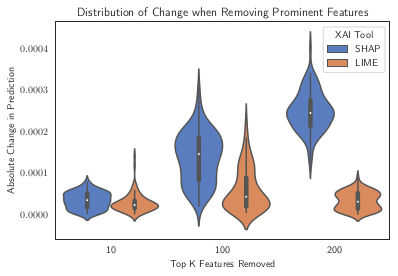

In [54]:
import seaborn as sns
import matplotlib 

fig = plt.figure(figsize=(8, 4))
fig.tight_layout()

matplotlib.use("pgf")
matplotlib.rcParams.update({
    "pgf.texsystem": "pdflatex",
    'font.family': 'serif',
    'text.usetex': True,
    'pgf.rcfonts': False,
    "pgf.preamble": [
        r"\usepackage[utf8x]{inputenc}",    # use utf8 fonts 
        r"\usepackage[T1]{fontenc}",        # plots will be generated
        r"\usepackage{siunitx}",
        ]                                   # using this preamble
})

sns.set_style("white")

sns.violinplot(x="K", y="Change", hue="XAI Tool",
               data = changes_information_df, showfliers = False, palette="muted", scale="width", width=0.85)
plt.title("Distribution of Change when Removing Prominent Features")
plt.xlabel("Top K Features Removed")
plt.ylabel("Absolute Change in Prediction")
plt.xticks(rotation=0)

plt.show()
!mkdir -p Dataset-Analysis/charts
# plt.savefig('Dataset-Analysis/charts/prediction_change.pdf', bbox_inches='tight')

### Interpret-ability of Rulematirx 

Use the rules selected by rule matrix to determine the significance?


In [55]:
# rules = surrogate.student.rule_list
# depths = []
# entropy_rulematrix = []

# for index in range(len(domain_train_flattened)):
#     decisions = surrogate.student.decision_path(domain_train_flattened[index:index+1])
#     decisions = np.matrix.flatten(decisions)
#     depth = np.sum(decisions)
#     depths.append(depth)
#     entropy_rulematrix.append(entropy(decisions))

# print("Train decision depth - Average: %0.3f, Std: %0.3f, Min: %0.3f, Max: %0.3f" %
#       (np.average(depths), np.std(depths), np.min(depths), np.max(depths)))
# print("Rulematrix test entropy - Average: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
#       (np.average(entropy_rulematrix), np.std(entropy_rulematrix), np.min(entropy_rulematrix), np.max(entropy_rulematrix)))


In [56]:
rules = surrogate.student.rule_list
depths = []
entropy_rulematrix = []

for index in range(len(domain_test_flattened)):
    decisions = surrogate.student.decision_path(domain_test_flattened[index:index+1])
    decisions = np.matrix.flatten(decisions)
    depth = np.sum(decisions)
    depths.append(depth)
    entropy_rulematrix.append(entropy(decisions))

print("Test decision depth - Average: %0.3f, Std: %0.3f, Min: %0.3f, Max: %0.3f" %
      (np.average(depths), np.std(depths), np.min(depths), np.max(depths)))
print("Rulematrix test entropy - Average: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.average(entropy_rulematrix), np.std(entropy_rulematrix), np.min(entropy_rulematrix), np.max(entropy_rulematrix)))


Test decision depth - Average: 4.925, Std: 0.452, Min: 1.000, Max: 5.000
Rulematrix test entropy - Average: 1.58588, Std: 0.15805, Min: 0.000, Max: 1.609


In [57]:
rules = surrogate.student.rule_list
depths = []
entropy_rulematrix = []

for index in complexity_indices:
    decisions = surrogate.student.decision_path(domain_test_flattened[index:index+1])
    decisions = np.matrix.flatten(decisions)
    depth = np.sum(decisions)
    depths.append(depth)
    entropy_rulematrix.append(entropy(decisions))

print("Subset decision depth - Average: %0.3f, Std: %0.3f, Min: %0.3f, Max: %0.3f" %
      (np.average(depths), np.std(depths), np.min(depths), np.max(depths)))

print("Rulematrix subset entropy - Average: %0.5f, Std: %0.5f, Min: %0.3f, Max: %0.3f" %
      (np.average(entropy_rulematrix), np.std(entropy_rulematrix), np.min(entropy_rulematrix), np.max(entropy_rulematrix)))

rulematrix_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
rulematrix_entropy_information_df["Entropy"] = entropy_rulematrix
rulematrix_entropy_information_df["XAI Tool"] = "RuleMatrix"
rulematrix_entropy_information_df["Size"] = int(np.max(depths))

max_rule_matrix_depth = int(np.max(depths))


Subset decision depth - Average: 4.900, Std: 0.592, Min: 1.000, Max: 5.000
Rulematrix subset entropy - Average: 1.57214, Std: 0.23027, Min: 0.000, Max: 1.609


### Baseline Entropy Sampling

This is just a baseline sample of entropy under various conditions.

In [58]:
def sample_entropy(size, random_fn=np.random.normal):
    arr = np.abs(random_fn(size=size))
    random_sample = arr.round(3)
    return entropy(random_sample)

samples = 10000
sample_normal_100 = [sample_entropy(100, np.random.normal) for _ in range(samples)]
sample_uniform_100 = [sample_entropy(100, np.random.uniform) for _ in range(samples)]
sample_normal_10 = [sample_entropy(10, np.random.normal) for _ in range(samples)]
sample_normal_720 = [sample_entropy(720, np.random.normal) for _ in range(samples)]
sample_uniform_720 = [sample_entropy(720, np.random.uniform) for _ in range(samples)]
sample_uniform_10 = [sample_entropy(10, np.random.uniform) for _ in range(samples)]

sample_uniform_rm = [sample_entropy(max_rule_matrix_depth, np.random.uniform) for _ in range(samples)]

print("Uniform 720 entropy: Avg=%0.5f, Std=%0.5f, Min=%0.3f, Max=%0.3f" %
      (np.average(sample_uniform_720), np.std(sample_uniform_720),
       np.min(sample_uniform_720), np.max(sample_uniform_720)))
print("Uniform 100 entropy: Avg=%0.5f, Std=%0.5f, Min=%0.3f, Max=%0.3f" %
      (np.average(sample_uniform_100), np.std(sample_uniform_100),
       np.min(sample_uniform_100), np.max(sample_uniform_100)))
print("Uniform 10 entropy: Avg=%0.5f, Std=%0.5f, Min=%0.3f, Max=%0.3f" %
      (np.average(sample_uniform_100), np.std(sample_uniform_100),
       np.min(sample_uniform_100), np.max(sample_uniform_100)))
print(" Normal 720 entropy: Avg=%0.5f, Std=%0.5f, Min=%0.3f, Max=%0.3f" %
      (np.average(sample_normal_720), np.std(sample_normal_720),
       np.min(sample_normal_720), np.max(sample_normal_720)))
print(" Normal 100 entropy: Avg=%0.5f, Std=%0.5f, Min=%0.3f, Max=%0.3f" %
      (np.average(sample_normal_100), np.std(sample_normal_100),
       np.min(sample_normal_100), np.max(sample_normal_100)))
print(" Normal  10 entropy: Avg=%0.5f, Std=%0.5f, Min=%0.3f, Max=%0.3f" %
      (np.average(sample_normal_10), np.std(sample_normal_10),
       np.min(sample_normal_10), np.max(sample_normal_10)))
print("Sequential 720 entropy: %0.5f" % (entropy(np.arange(720))))
print("Sequential 100 entropy: %0.5f" % (entropy(np.arange(100))))
print("Sequential  10 entropy: %0.5f" % (entropy(np.arange( 10))))

random_10_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
random_10_entropy_information_df["Entropy"] = sample_uniform_10
random_10_entropy_information_df["XAI Tool"] = "Random"
random_10_entropy_information_df["Size"] = 10

random_100_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
random_100_entropy_information_df["Entropy"] = sample_uniform_100
random_100_entropy_information_df["XAI Tool"] = "Random"
random_100_entropy_information_df["Size"] = 100

random_720_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
random_720_entropy_information_df["Entropy"] = sample_uniform_720
random_720_entropy_information_df["XAI Tool"] = "Random"
random_720_entropy_information_df["Size"] = 720

random_rm_entropy_information_df = pd.DataFrame(columns=entropy_information_columns)
random_rm_entropy_information_df["Entropy"] = sample_uniform_rm
random_rm_entropy_information_df["XAI Tool"] = "Random"
random_rm_entropy_information_df["Size"] = max_rule_matrix_depth



Uniform 720 entropy: Avg=6.38637, Std=0.01026, Min=6.346, Max=6.427
Uniform 100 entropy: Avg=4.41249, Std=0.02707, Min=4.306, Max=4.511
Uniform 10 entropy: Avg=4.41249, Std=0.02707, Min=4.306, Max=4.511
 Normal 720 entropy: Avg=6.29590, Std=0.01312, Min=6.244, Max=6.347
 Normal 100 entropy: Avg=4.32339, Std=0.03530, Min=4.157, Max=4.449
 Normal  10 entropy: Avg=2.03965, Std=0.10663, Min=1.499, Max=2.293
Sequential 720 entropy: 6.38541
Sequential 100 entropy: 4.40690
Sequential  10 entropy: 2.04984


In [59]:
entropy_information_df = pd.DataFrame(columns=entropy_information_columns)

entropy_information_df = entropy_information_df.append(shap_entropy_information_df)
entropy_information_df = entropy_information_df.append(lime_10_entropy_information_df)
entropy_information_df = entropy_information_df.append(lime_100_entropy_information_df)
entropy_information_df = entropy_information_df.append(lime_720_entropy_information_df)
entropy_information_df = entropy_information_df.append(rulematrix_entropy_information_df)
entropy_information_df = entropy_information_df.append(random_10_entropy_information_df)
entropy_information_df = entropy_information_df.append(random_100_entropy_information_df)
entropy_information_df = entropy_information_df.append(random_720_entropy_information_df)
entropy_information_df = entropy_information_df.append(random_rm_entropy_information_df)

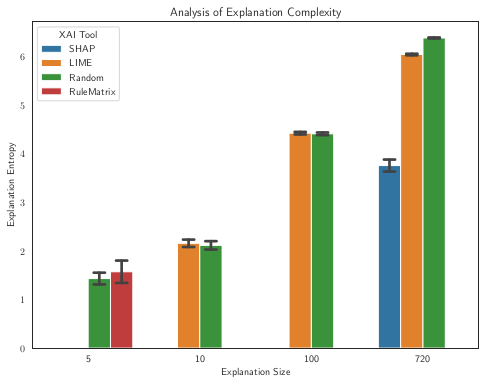

In [60]:
import seaborn as sns

fig = plt.figure(figsize=(8,6))
fig.tight_layout()

matplotlib.use("pgf")
matplotlib.rcParams.update({
    "pgf.texsystem": "pdflatex",
    'font.family': 'serif',
    'text.usetex': True,
    'pgf.rcfonts': False,
})

sns.set_style("white")

# sns.violinplot(x="Size", y="Entropy", hue="XAI Tool",
#                data = entropy_information_df, showfliers = False,
#                hue_order=["SHAP", "LIME", "Random", "RuleMatrix"], widths=5, width=0.95, scale="width")
sns.barplot(x="Size", y="Entropy", hue="XAI Tool",
               data = entropy_information_df,
               hue_order=["SHAP", "LIME", "Random", "RuleMatrix"], ci="sd", capsize=.1)
plt.title("Analysis of Explanation Complexity")
plt.xlabel("Explanation Size")
plt.ylabel("Explanation Entropy")
plt.xticks(rotation=0)
# plt.ylim([1.5,6.6])

plt.show()
plt.savefig('Dataset-Analysis/charts/entropy_complexity_analysis.pdf', bbox_inches='tight')